In [11]:
# -*- coding: utf-8 -*-
import os, sys
import glob
import json
sys.path.append("..")
sys.path.append("../..")
import dataset_utils.utils
import dataset_utils.config as config
import pympi
import sklearn.metrics as metrics
from collections import defaultdict
import copy
import pickle
import utils
import smoothing_methods

In [2]:
%matplotlib inline
import matplotlib
import matplotlib.pyplot as plt

In [3]:
prediction_dir = os.path.join(config.DS_DIALOG, "detection_result")
ant_dir = os.path.join(config.DS_DIALOG, "ant")
img_dir = os.path.join(config.DS_DIALOG, "image")
meta_dir = os.path.join(config.DS_DIALOG, "meta_info")
movie_files = ["01_01.MP4", "01_02.MP4", "02_01.MP4", "02_02.MP4", "03_01.MP4", "03_02.MP4", "04_01.MP4", "04_02.MP4", "05_01.MP4", "05_02.MP4"]
fig_dir = os.path.join(config.DS_DIALOG, "figure")
if not os.path.exists(fig_dir):
    os.mkdir(fig_dir)

## シングルフレーム検出の結果分析 (raw)

In [47]:
test_ids = [("05_01", "A"), ("05_01", "C"), ("05_01", "D"), ("05_02", "A"), ("05_02", "C"), ("05_02", "D")]

In [6]:
for movie_id, seat_id in test_ids:
    frame_num = utils.frame_num(img_dir, movie_id)
    labels = utils.load_ts(movie_id, seat_id, ant_dir, frame_num)
    preds = utils.load_xs(movie_id, seat_id, prediction_dir, frame_num, "score")
    preds = [float(pred) for pred in preds]
    # visualize result
    fig_path = "./figure/raw/%s_%s.png" % (movie_id, seat_id)
    title="Raw: %s_%s" % (movie_id, seat_id)
#     utils.visualize(labels, preds, frame_num, title=title, fig_path=fig_path, big=True)
    
    # calculate score
    f1_score = metrics.f1_score(labels, [round(p) for p in preds])
    auc_score = metrics.roc_auc_score(labels, [p for p in preds])
    print("%s_%s" % (movie_id, seat_id))
    print("f1_score: %f" % f1_score)
    print("auc_score: %f" % auc_score)
    f1_scores.append(f1_score)
    auc_scores.append(auc_score)
print("f1_score (average): %f" % (sum(f1_scores)/len(f1_scores)))
print("auc_score (average): %f" % (sum(auc_scores)/len(auc_scores)))

Parsing unknown version of ELAN spec... This could result in errors...
05_01_A
f1_score: 0.829452
auc_score: 0.863523
Parsing unknown version of ELAN spec... This could result in errors...
05_01_C
f1_score: 0.793440
auc_score: 0.936829
Parsing unknown version of ELAN spec... This could result in errors...
05_01_D
f1_score: 0.845833
auc_score: 0.937051
Parsing unknown version of ELAN spec... This could result in errors...
05_02_A
f1_score: 0.852743
auc_score: 0.916457
Parsing unknown version of ELAN spec... This could result in errors...
05_02_C
f1_score: 0.788118
auc_score: 0.927384
Parsing unknown version of ELAN spec... This could result in errors...
05_02_D
f1_score: 0.873921
auc_score: 0.958642
f1_score (average): 0.830584
auc_score (average): 0.923314


## 移動平均による平滑化の結果分析 (average)

In [12]:
def get_all_dataset_ids(img_dir, meta_dir):
    movie_ids = sorted([dname for dname in os.listdir(img_dir) if dname[0] != '.'])
    movie_ids = [(movie_id.split("_")[0], movie_id.split("_")[1]) for movie_id in movie_ids]
    dataset_ids = []
    for group_id, session_id in movie_ids:
        meta_path = os.path.join(meta_dir, "%s.json" % group_id)
        meta_info = json.load(open(meta_path))
        for seat_id in sorted(meta_info.keys()):
            dataset_ids.append((group_id, session_id, seat_id))
    return dataset_ids

In [44]:
def search_best_window_size(test_group_id):
    dataset_ids = get_all_dataset_ids(img_dir, meta_dir)
    dataset_ids = [dataset_id for dataset_id in dataset_ids if int(dataset_id[0]) != test_group_id]
     
    result = defaultdict(list)

    for group_id, session_id, seat_id in dataset_ids:
        movie_id = "%s_%s" % (group_id, session_id)    
        frame_num = utils.frame_num(img_dir, movie_id)
        ts = utils.load_ts(movie_id, seat_id, ant_dir, frame_num)
        ys = utils.load_xs(movie_id, seat_id, prediction_dir, frame_num, "score")
        preds = [float(y) for y in ys]
        for window in range(2, 25):
            ave_scores = []
            ave_preds = smoothing_methods.pre_average_predictions(preds, window=window)
            score = metrics.roc_auc_score(ts, ave_preds)
            result[window].append(score)
    return max(result, key=lambda key: sum(result[key])/len(result[key]))

In [45]:
best_window_size = search_best_window_size(5)
print(best_window_size)

Parsing unknown version of ELAN spec... This could result in errors...
Parsing unknown version of ELAN spec... This could result in errors...
Parsing unknown version of ELAN spec... This could result in errors...
Parsing unknown version of ELAN spec... This could result in errors...
Parsing unknown version of ELAN spec... This could result in errors...
Parsing unknown version of ELAN spec... This could result in errors...
Parsing unknown version of ELAN spec... This could result in errors...
Parsing unknown version of ELAN spec... This could result in errors...
Parsing unknown version of ELAN spec... This could result in errors...
Parsing unknown version of ELAN spec... This could result in errors...
Parsing unknown version of ELAN spec... This could result in errors...
Parsing unknown version of ELAN spec... This could result in errors...
Parsing unknown version of ELAN spec... This could result in errors...
Parsing unknown version of ELAN spec... This could result in errors...
Parsin

Parsing unknown version of ELAN spec... This could result in errors...


/usr/local/lib/python2.7/dist-packages/matplotlib/collections.py:590: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  if self._edgecolors == str('face'):


05_01_A
f1_score: 0.828877
auc_score: 0.876969
Parsing unknown version of ELAN spec... This could result in errors...
05_01_C
f1_score: 0.827662
auc_score: 0.957194
Parsing unknown version of ELAN spec... This could result in errors...
05_01_D
f1_score: 0.850167
auc_score: 0.944172
Parsing unknown version of ELAN spec... This could result in errors...
05_02_A
f1_score: 0.861914
auc_score: 0.927306
Parsing unknown version of ELAN spec... This could result in errors...
05_02_C
f1_score: 0.830473
auc_score: 0.954605
Parsing unknown version of ELAN spec... This could result in errors...
05_02_D
f1_score: 0.883815
auc_score: 0.967415
f1_score (average): 0.847151
auc_score (average): 0.937943


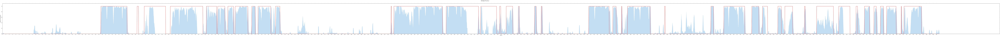

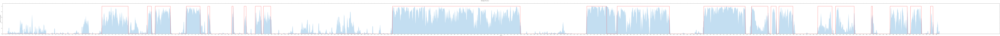

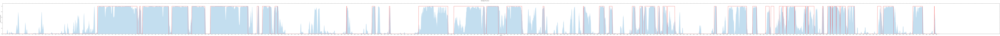

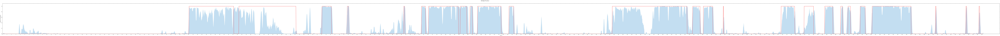

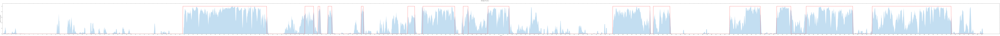

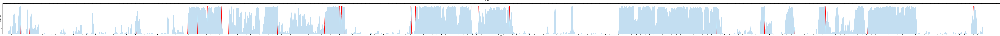

In [48]:
f1_scores = []
auc_scores = []
for movie_id, seat_id in test_ids:
    frame_num = utils.frame_num(img_dir, movie_id)
    labels = utils.load_ts(movie_id, seat_id, ant_dir, frame_num)
    preds = utils.load_xs(movie_id, seat_id, prediction_dir, frame_num, "score")
    
    preds = [float(pred) for pred in preds]
    preds = smoothing_methods.pre_average_predictions(preds, window=best_window_size)
    
    # visualize result
    fig_path = "./figure/average/%s_%s.png" % (movie_id, seat_id)
    title="Average: %s_%s" % (movie_id, seat_id)
    utils.visualize(labels, preds, frame_num, title=title, fig_path=fig_path, big=True)
    
    # calculate score
    f1_score = metrics.f1_score(labels, [round(p) for p in preds])
    auc_score = metrics.roc_auc_score(labels, [p for p in preds])
    print("%s_%s" % (movie_id, seat_id))
    print("f1_score: %f" % f1_score)
    print("auc_score: %f" % auc_score)
    f1_scores.append(f1_score)
    auc_scores.append(auc_score)
print("f1_score (average): %f" % (sum(f1_scores)/len(f1_scores)))
print("auc_score (average): %f" % (sum(auc_scores)/len(auc_scores)))

05_01_A
f1_score: 0.853644
auc_score: 0.922047
05_01_C
f1_score: 0.890898
auc_score: 0.964032
05_01_D
f1_score: 0.842786
auc_score: 0.944176
05_02_A
f1_score: 0.896383
auc_score: 0.959187
05_02_C
f1_score: 0.854043
auc_score: 0.948303
05_02_D
f1_score: 0.876245
auc_score: 0.966428
f1_score (average): 0.869000
auc_score (average): 0.950696


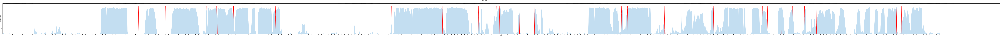

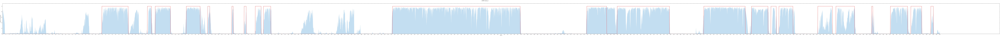

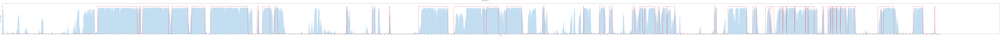

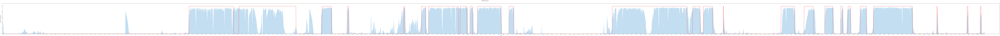

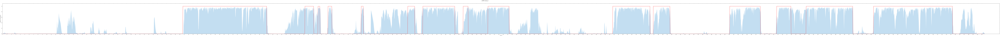

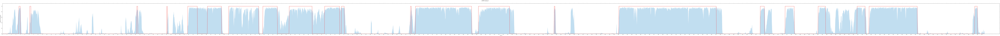

In [10]:
f1_scores = []
auc_scores = []
for movie_id, seat_id in test_ids:
    path = os.path.join("./prediction", "%s_%s.pickle" % (movie_id, seat_id))
    labels, preds = pickle.load(open(path, "r"))
    preds = [pred[1] for pred in preds]
    frame_num = len(labels)
    
    # visualize result
    fig_path = "./figure/lstm/%s_%s.png" % (movie_id, seat_id)
    title="LSTM: %s_%s" % (movie_id, seat_id)
    utils.visualize(labels, preds, frame_num, title=title, fig_path=fig_path, big=True)
    
    # calculate score
    f1_score = metrics.f1_score(labels, [round(p) for p in preds])
    auc_score = metrics.roc_auc_score(labels, [p for p in preds])
    print("%s_%s" % (movie_id, seat_id))
    print("f1_score: %f" % f1_score)
    print("auc_score: %f" % auc_score)
    f1_scores.append(f1_score)
    auc_scores.append(auc_score)
print("f1_score (average): %f" % (sum(f1_scores)/len(f1_scores)))
print("auc_score (average): %f" % (sum(auc_scores)/len(auc_scores)))